In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
#import scanorama
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

### Глобальные переменные

In [2]:
qc_palette = sns.color_palette(['red', 'gray'])

In [33]:
layer_palette = {'Empty spots': '#1f77b4',
                 'WM': '#bcbd22',
                 'L1': '#ff7f0e',
                 'L6': '#e377c2',
                 'L2': '#2ca02c',
                 'L3': '#d62728',
                 'L4': '#9467bd',
                 'L5': '#8c564b'}

# Подгрузим файлы

In [3]:
# Define paths and get sample_ids
file_list = os.listdir('../data/raw_spatial_data/chimp/')
file_list

['chimp_11454', 'chimp_13302', 'chimp_13309', 'chimp_j11', 'chimp_j8']

In [4]:
file = 'chimp_11454'

In [5]:
# аннотация слоёв
ann = pd.read_csv('../data/clusters/' + file + '.csv', index_col=0)
ann.columns = ['label']
ann.head()

,label
Barcode,
AAACAAGTATCTCCCA-1,L3
AAACACCAATAACTGC-1,L6
AAACAGAGCGACTCCT-1,Empty spots
AAACAGCTTTCAGAAG-1,L5
AAACAGGGTCTATATT-1,Empty spots


In [7]:
# каунты секвенирования
adata = sc.read_visium('../data/raw_spatial_data/chimp/'+ file)
adata.var_names_make_unique()
adata.obs['label'] = ann.label
adata.obs['sample_id'] = file

reading ..\data\raw_spatial_data\chimp\chimp_11454\filtered_feature_bc_matrix.h5
 (0:00:00)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


# adata

## Посчитаем метрики

In [8]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

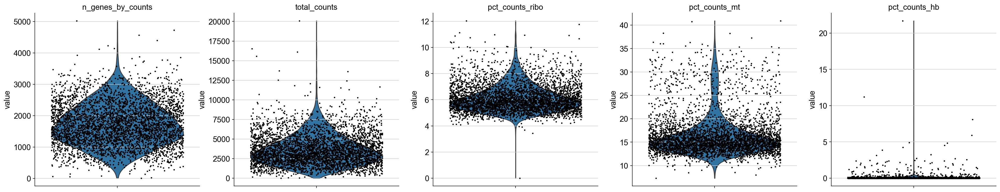

In [9]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, rotation= 45, multi_panel=True, size=2.5)

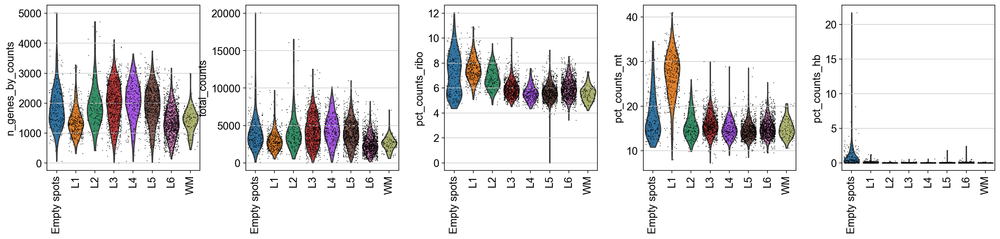

In [10]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo','pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, groupby = 'label', rotation= 90, palette=layer_palette)

Видим, что число каунтов и задетектированых генов занижено у `L1`, `L6` и `WM` слоёв. Поэтому хотелось бы быть с ними аккуратнее. Хочется заметить высокий процент митохондриальных генов в `L1`

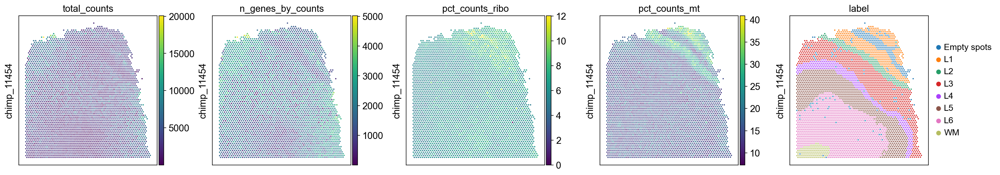

In [11]:
sq.pl.spatial_scatter(adata,
                      color = ['total_counts', 'n_genes_by_counts','pct_counts_ribo','pct_counts_mt', 'label'],
                      ncols=5, img=False, axis_label=['', file])

### Libriary size

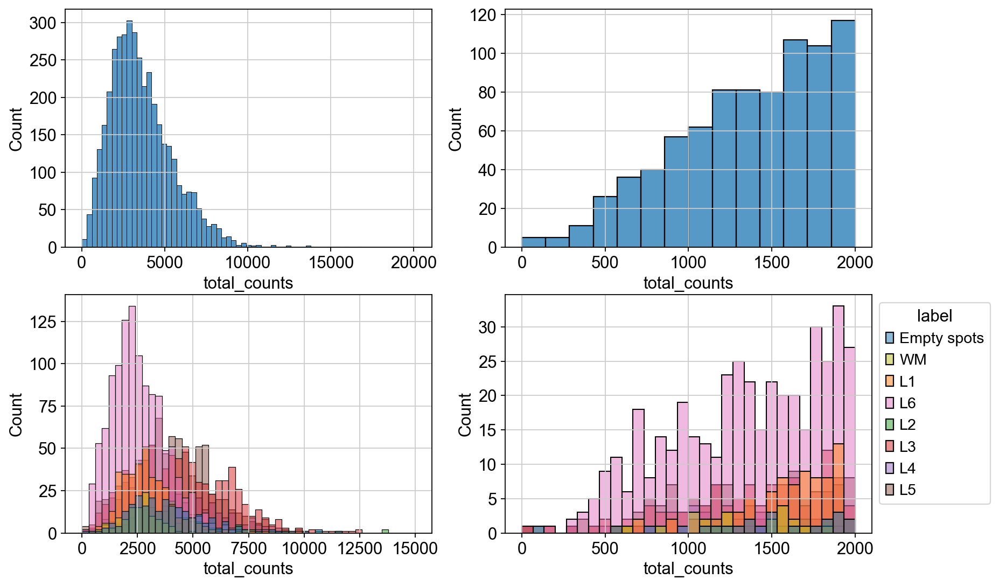

In [34]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='total_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 15000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='total_counts', binrange=[0, 2000], ax=axs[0][1])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 2000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Видим, что большинство спотов низкого качества пришло из `L6`. Посмотрим на остальные споты

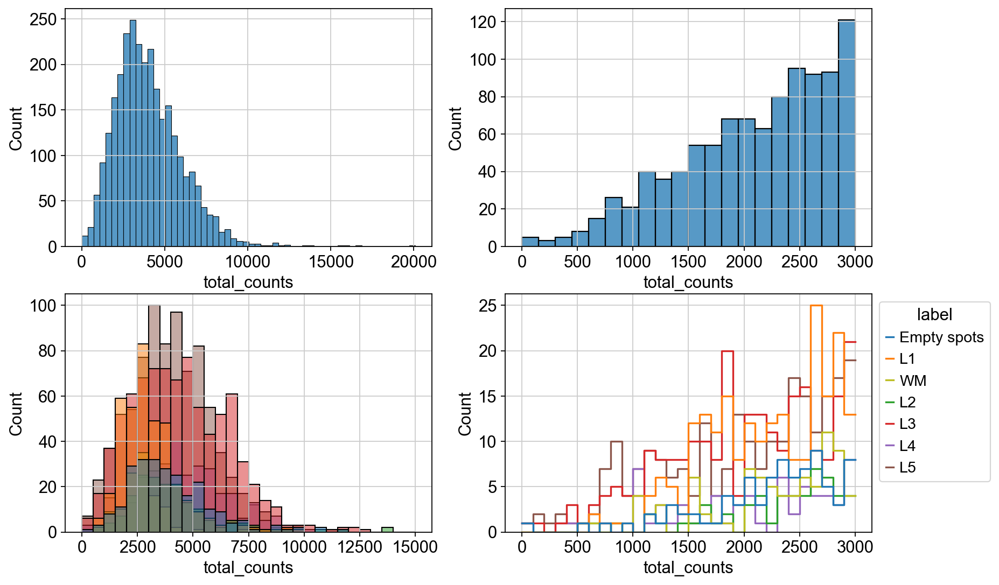

In [47]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'L1', 'WM', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs[adata.obs.label != 'L6'], x='total_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 15000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs[adata.obs.label != 'L6'], bins=20, x='total_counts', binrange=[0, 3000], ax=axs[0][1])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=False, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Выберем порог по `total counts = 2000`. Поставим порог для `L6` и для всех остальных по отдельности

In [49]:
adata.obs['qc_lib_size'] = (((adata.obs['total_counts'] > 800) & (adata.obs.label != 'L6')) |
                            ((adata.obs['total_counts'] > 500) & (adata.obs.label == 'L6'))).astype('string')
#adata.obs['qc_lib_size'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)

vc = adata.obs.groupby('qc_lib_size')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_lib_size'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=60

label
L5             16
L6             16
L3             14
L1              4
L4              4
Empty spots     3
L2              2
WM              1
Name: label, dtype: int64


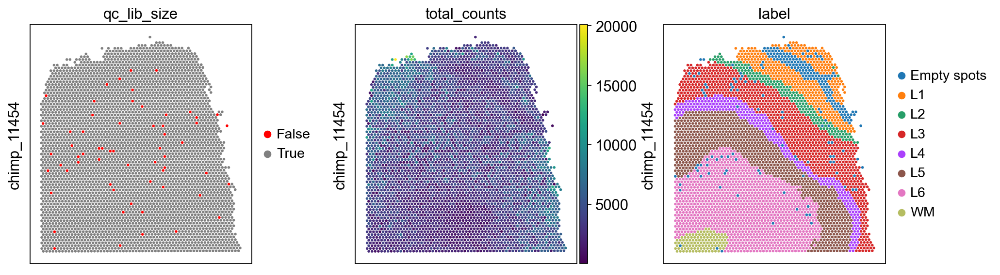

In [50]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_lib_size', 'total_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Number of expressed features

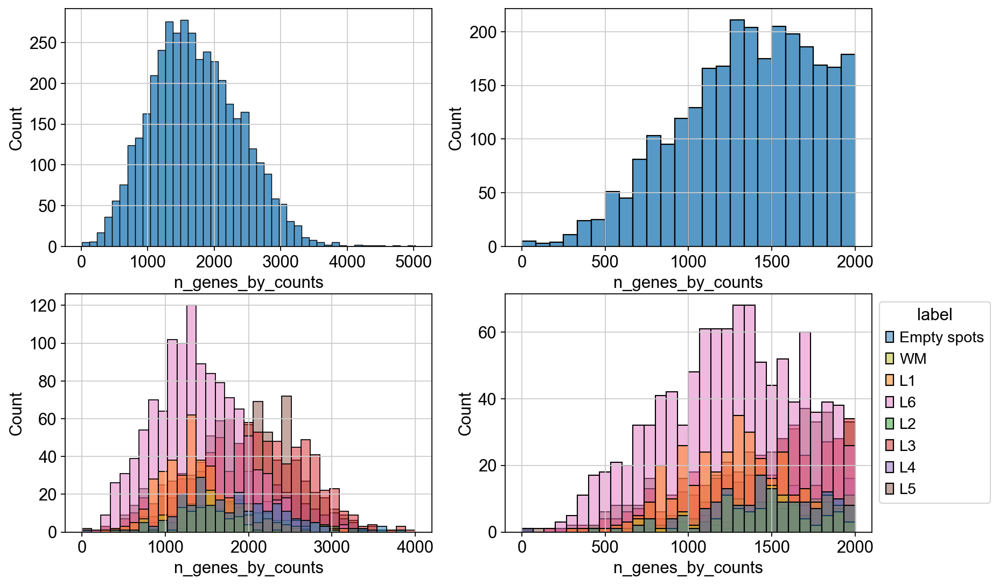

In [51]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 4000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], ax=axs[0][1])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Видим, что большинство спотов низкого качества пришло из `L6`. Посмотрим на остальные споты

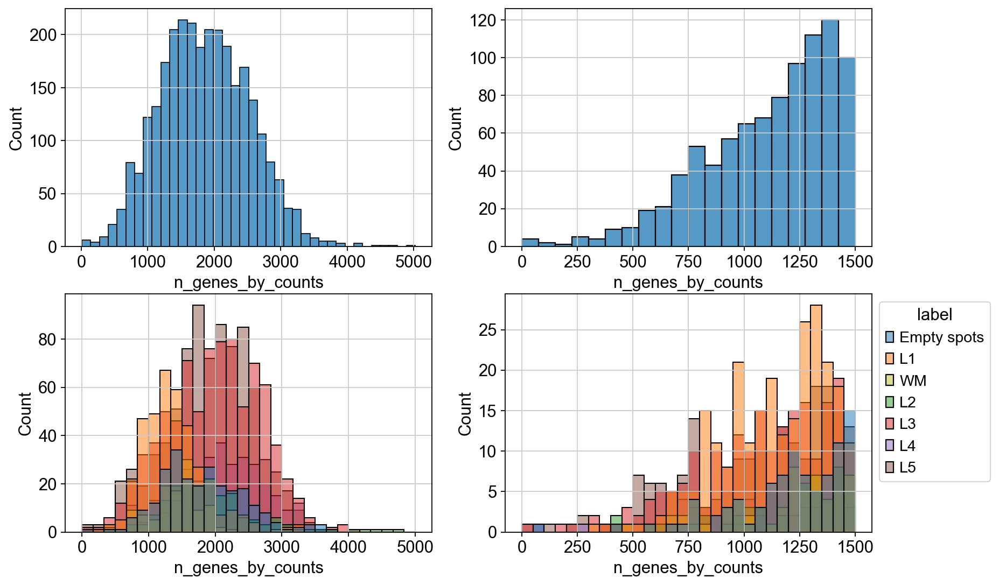

In [65]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'L1', 'WM', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs[adata.obs.label != 'L6'], x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 5000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs[adata.obs.label != 'L6'], bins=20, x='n_genes_by_counts', binrange=[0, 1500], ax=axs[0][1])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 1500], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Выберем порог по `total n_genes_by_counts = 1000`. Поставим порог для `WM` и для всех остальных по отдельности

In [58]:
adata.obs['qc_n_genes'] = (((adata.obs['n_genes_by_counts'] > 600) & (adata.obs.label != 'L6'))
                           | ((adata.obs['n_genes_by_counts'] > 500) & (adata.obs.label == 'L6'))).astype('string')
#adata.obs['qc_n_genes'].replace({True: 'True', False: 'False'}, inplace=True)
vc = adata.obs.groupby('qc_n_genes')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_n_genes'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=97

label
L6             42
L5             22
L3             16
L1              6
L4              4
Empty spots     3
L2              2
WM              2
Name: label, dtype: int64


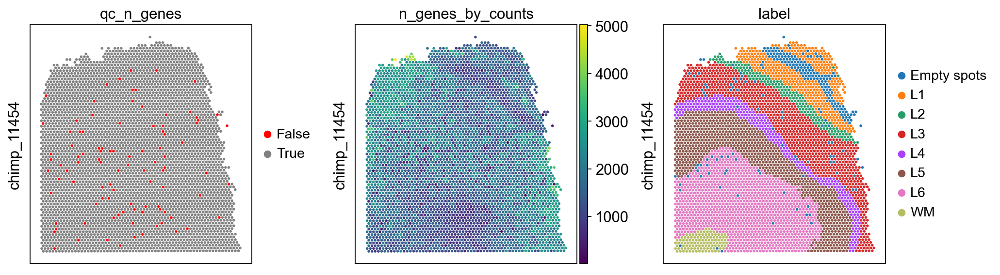

In [59]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_n_genes', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of mitochondrial reads

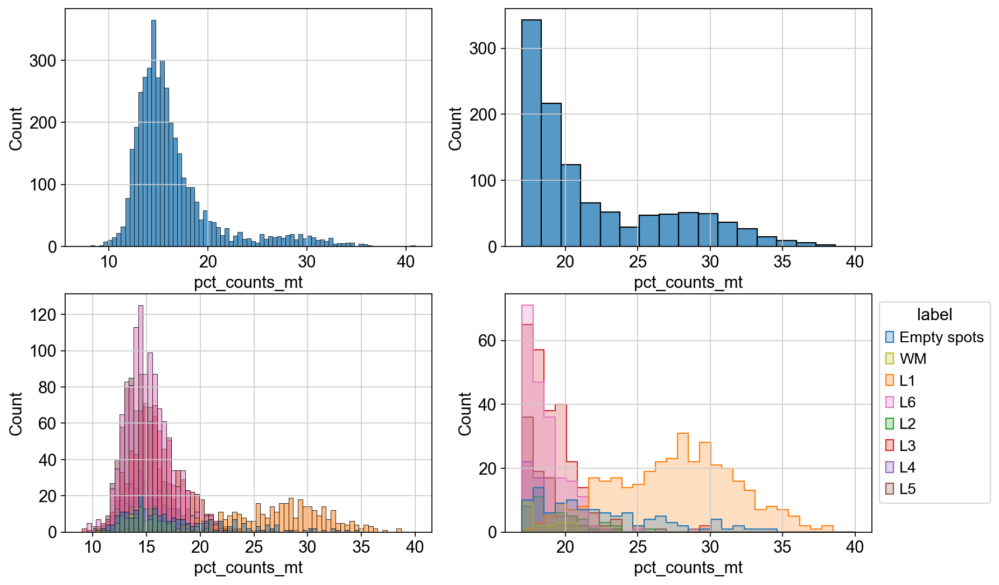

In [69]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_mt', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[9, 40], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[17, 40], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[17, 40], hue='label', bins=30, hue_order=hue_order, ax=axs[1][1], fill=True, element="step", palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Поставим для всех не из `L1` порог `pct_counts_mt = 25`, а для `L1` порог `pct_counts_mt = 32`.

In [72]:
adata.obs['qc_mt'] = (((adata.obs['pct_counts_mt'] <= 25) & (adata.obs.label != 'L1'))
                           | ((adata.obs['pct_counts_mt'] < 32) & (adata.obs.label == 'L1'))).astype('string')
#adata.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_mt')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_mt'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=87

label
L1             52
Empty spots    27
L3              3
L5              2
L2              1
L4              1
L6              1
Name: label, dtype: int64


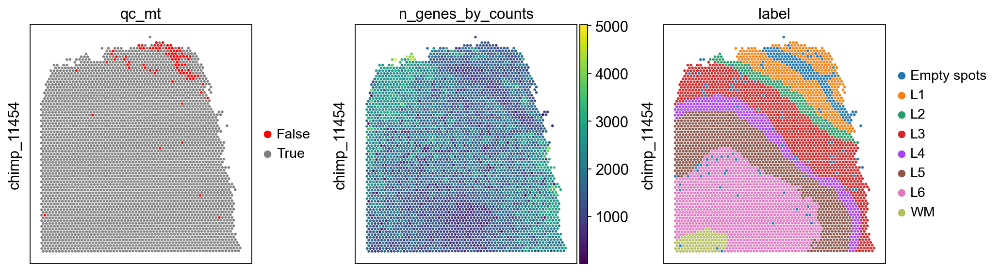

In [73]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_mt', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

## Combined

### QC spatial_scatter

In [74]:
d = {'True': True, 'False': False}
adata.obs['qc_lib_size'] = adata.obs['qc_lib_size'].astype(object).replace(d)
adata.obs['qc_n_genes'] = adata.obs['qc_n_genes'].astype(object).replace(d)
adata.obs['qc_mt'] = adata.obs['qc_mt'].astype(object).replace(d)

In [75]:
adata.obs['qc_good_spots'] = (adata.obs.qc_lib_size * adata.obs.qc_n_genes * adata.obs.qc_mt).astype('string')
vc = adata.obs.groupby('qc_good_spots')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_good_spots'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=178

label
L1             57
L6             43
Empty spots    30
L5             22
L3             17
L4              4
L2              3
WM              2
Name: label, dtype: int64


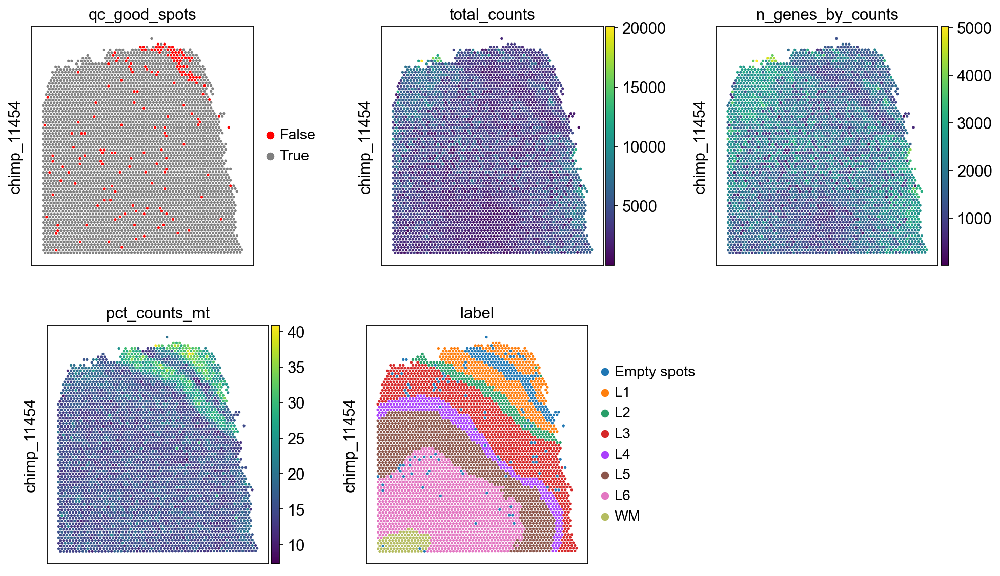

In [76]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_good_spots',  'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'label'],
                          img=False, axis_label=['', file], size=1.3, ncols=3)

### QC scatter plots

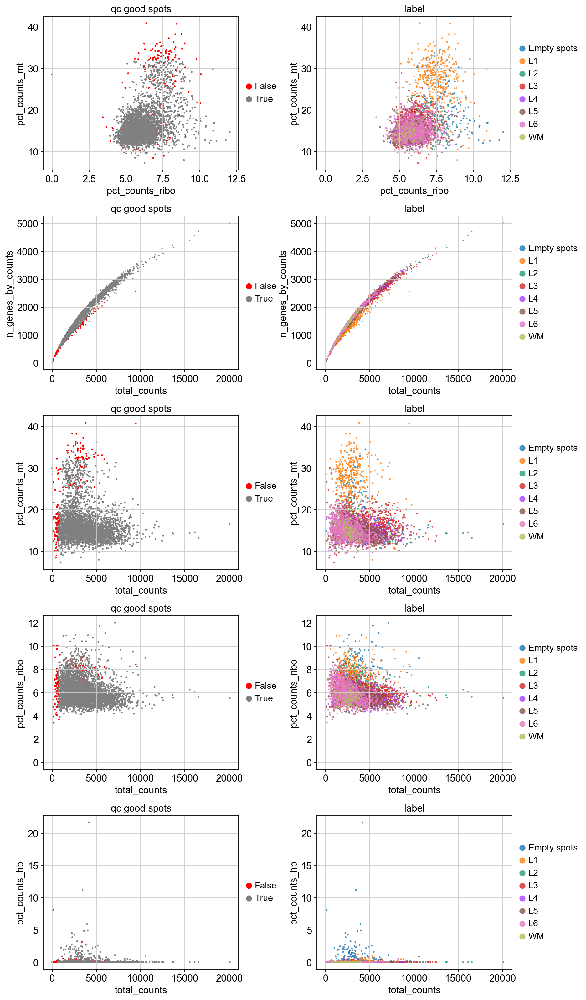

In [78]:
fig, ax = plt.subplots(5, 2, figsize=(12, 25), gridspec_kw={'wspace': 0.4, 'hspace': 0.3})
alpha = 0.8

sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="qc_good_spots", ax=ax[0][0], show=False, size=25)
sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="label", ax=ax[0][1], show=False, size=25, alpha=alpha)

sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="qc_good_spots", ax=ax[1][0], show=False, size=15)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="label", ax=ax[1][1], show=False, alpha=alpha, size=15)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="qc_good_spots", ax=ax[2][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="label", ax=ax[2][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="qc_good_spots", ax=ax[3][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="label", ax=ax[3][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="qc_good_spots", ax=ax[4][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="label", ax=ax[4][1], show=False, alpha=alpha, size=25)

plt.show()

### Cохраним отфильтрованые споты (без пустых)

In [79]:
good_spots = adata.obs[(adata.obs.qc_good_spots == 'True') & (adata.obs.label != 'Empty spots')].index

In [80]:
adata_filtered = adata[good_spots].copy()

### PCA

In [81]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:26)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


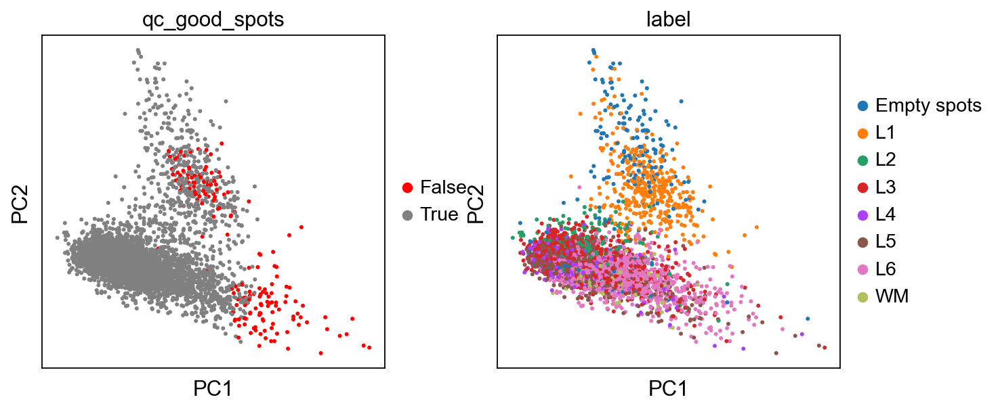

In [82]:
sc.pl.pca(adata, color=['qc_good_spots', 'label'])

Меня очень напрягает `L1` слой. Есть чувство, что проще выкинуть его полностью для этого слайда

## Сохраним в .h5ad

In [83]:
adata_filtered.obs.drop(['qc_lib_size','qc_n_genes', 'qc_good_spots', 'qc_mt'], axis=1, inplace=True)

In [84]:
adata_filtered.obs.head()

,in_tissue,array_row,array_col,label,sample_id,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_hb,pct_counts_hb,total_counts_ribo,pct_counts_ribo
AAACAAGTATCTCCCA-1,1,50,102,L3,chimp_11454,1764,3412.0,491.0,14.390387,0.0,0.000000,226.0,6.623681
AAACACCAATAACTGC-1,1,59,19,L6,chimp_11454,2489,5417.0,728.0,13.439173,2.0,0.036921,273.0,5.039690
AAACAGCTTTCAGAAG-1,1,43,9,L5,chimp_11454,2200,4913.0,863.0,17.565641,1.0,0.020354,258.0,5.251374
AAACAGTGTTCCTGGG-1,1,73,43,L6,chimp_11454,1520,2798.0,495.0,17.691208,0.0,0.000000,146.0,5.218013
AAACATGGTGAGAGGA-1,1,62,0,L6,chimp_11454,1921,3790.0,507.0,13.377309,0.0,0.000000,195.0,5.145119


In [86]:
os.makedirs('../results/filtered_samples', exist_ok=True)
os.makedirs('../results/filtered_samples/chimp', exist_ok=True)
adata_filtered.write_h5ad(f'../results/filtered_samples/chimp/{file}.h5ad')